<a href="https://colab.research.google.com/github/shailavij/ML-Projects/blob/master/Sales_forecast_US_store2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This analysis is based on US Store Sale data. 

Parts:
1. EDA
2.Time series Analysis & Predictive Modelling
3.Evaluation & Conclusions

In [23]:
# import required Libraries
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd
import os
from datetime import datetime
import pandas as pd
import plotly.express as px
from fbprophet import Prophet
from statsmodels.tsa.stattools import adfuller
import holidays

import seaborn as sns
import warnings
warnings.filterwarnings('ignore')




In [24]:
# Import sales Data
df= pd.read_csv('training_Sales.csv')
df.head()

,Date,Value
0,2013-11-07 13:00:00,830
1,2013-11-07 13:15:00,885
2,2013-11-07 13:30:00,938
3,2013-11-07 13:45:00,804
4,2013-11-07 14:00:00,793


#EDA 

In [25]:
df.shape

(67058, 2)

Sales data given for 67058 observations from year Nov 2013 - 2018. 

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67058 entries, 0 to 67057
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Date    67058 non-null  object
 1   Value   67058 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 1.0+ MB


In [27]:
# Convert Date column into Datetime format
df['Date']= pd.to_datetime(df['Date'])

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67058 entries, 0 to 67057
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    67058 non-null  datetime64[ns]
 1   Value   67058 non-null  int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 1.0 MB


In [29]:
# Checking Missing value
df.isnull().sum()

Date     0
Value    0
dtype: int64

There is no missing or NAN value in given dataset

In [30]:
fig = px.line(df, x='Date', y='Value', title='US Store Sales forecast')
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
                     dict(count=1, label='1y', step='year', stepmode='backward'),
                     dict(count=2, label='2y', step='year', stepmode='backward'),
                     dict(count=3, label='3y', step='year', stepmode='backward'),
                     dict(count=3, label='1m', step='month', stepmode='backward'),
                      dict(count=3, label='1d', step='day', stepmode='backward'),
                     dict(step='all')
        ])
    )
)
fig.show()

I can see that given time series data satisfy Stationarity .It's observed that mean & variance are constant over the period of time.

In [31]:
# To set Date as index column
df2= df.set_index('Date')
df2.head()

,Value
Date,
2013-11-07 13:00:00,830
2013-11-07 13:15:00,885
2013-11-07 13:30:00,938
2013-11-07 13:45:00,804
2013-11-07 14:00:00,793


In [32]:
# Take copy of Dataframe 
df3=df2.copy()
df3.head()

,Value
Date,
2013-11-07 13:00:00,830
2013-11-07 13:15:00,885
2013-11-07 13:30:00,938
2013-11-07 13:45:00,804
2013-11-07 14:00:00,793


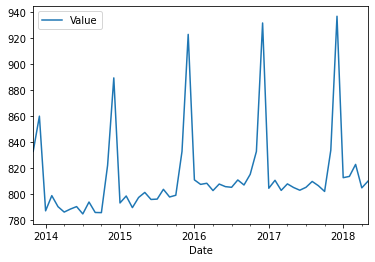

In [33]:
# Explore monthlywise data
df2.resample('M').mean().plot()

From the above plot, I can see there is always a seasonality of trend in every year during Nov, Dec month during Christmas.

In [34]:
# Extracting year, month, day and week, and making new column
df2['Year'] = df2.index.year
df2['Month'] = df2.index.month
df2['Day'] = df2.index.day
df2['WeekOfYear'] = df2.index.weekofyear
df2['Weekday'] = df2.index.weekday
df2.head()

,Value,Year,Month,Day,WeekOfYear,Weekday
Date,,,,,,
2013-11-07 13:00:00,830,2013,11,7,45,3
2013-11-07 13:15:00,885,2013,11,7,45,3
2013-11-07 13:30:00,938,2013,11,7,45,3
2013-11-07 13:45:00,804,2013,11,7,45,3
2013-11-07 14:00:00,793,2013,11,7,45,3


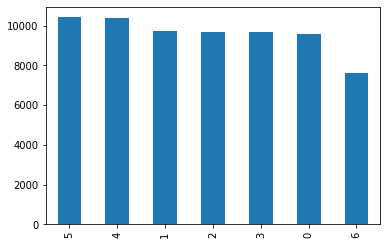

In [35]:
# Checking days when the stores were closed
df2['Weekday'].value_counts().plot(kind='bar');

From the above plot,I have observed that the Shop opened throughtout the week since there was some sales on all days

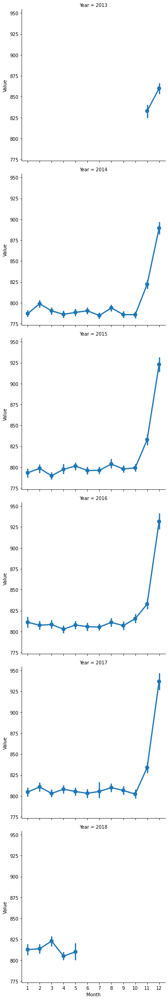

In [36]:
# Sales trend over the months
sns.factorplot(data = df2, x ="Month", y = "Value", row = "Year");

I can see from the above trends that sales tend to spike in November and December due to Christmas Holiday. So, there is a seasonality factor present in the data.

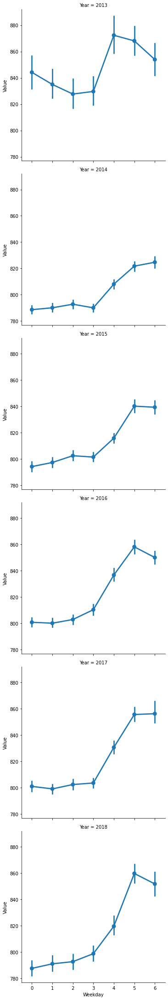

In [37]:
# Sales trend over 
sns.factorplot(data = df2, x ="Weekday", y = "Value", row = "Year");

I can see that sales tend to increasse during weekends( friday, saturday, sunday) compare to weedays

#Conclusion of EDA

1. Customers tends to buy more on Weekends compare to weekdays
2. There is increase in Sales during Novemeber and December months due to Christmas

## B. Time series Analysis & Predictive Modelling

#Stationarity of Time Series
In order to use time series forecasting models, we need to ensure that our time series data is stationary i.e constant mean, constant variance and constant covariance with time.

ADFuller test: This test provides us the statistical data such as p-value to understand whether we can reject the null hypothesis. The null hypothesis is that data is not stationary and the alternative hypothesis says that data is stationary. If p-value is less than the critical value (say 0.5), we will reject the null hypothesis and say that data is stationary.


In [38]:

result = adfuller(df2['Value'])

In [39]:
print(f'Test Statistics: {result[0]}')
print(f'p-value: {result[1]}')
print(f'Critial Values: {result[4]}')

if result[1] > 0.05 :
  print('Series is not Stationary')
else:
  print('Series is Stationary')

Test Statistics: -12.96380634382664
p-value: 3.184388348683477e-24
Critial Values: {'1%': -3.4304476125169594, '5%': -2.861583142968993, '10%': -2.566792963533525}
Series is Stationary


From the above statistical test,I have observed that P value < critical value . So I can conclude that given time series met stationarity requirement( Mean & variance constant over the period of time)

#Predictive Modelling

In [40]:
# US Holiday & National Holiday list
holidays_df = pd.DataFrame([], columns = ['ds','holiday'])

In [41]:
ldates = []
lnames = []
for date, name in sorted(holidays.US(prov='US', years=np.arange(2013, 2018 + 1)).items()):
    ldates.append(date)
    lnames.append(name)

In [42]:
ldates = np.array(ldates)
lnames = np.array(lnames)

In [43]:
holidays_df.loc[:,'ds'] = ldates

In [44]:
holidays_df.loc[:,'holiday'] = lnames

In [45]:
holidays_df.holiday.unique()


array(["New Year's Day", 'Martin Luther King Jr. Day',
       "Washington's Birthday", 'Memorial Day', 'Independence Day',
       'Labor Day', 'Columbus Day', 'Veterans Day', 'Thanksgiving',
       'Christmas Day', 'Independence Day (Observed)',
       'Christmas Day (Observed)', "New Year's Day (Observed)",
       'Veterans Day (Observed)'], dtype=object)

I have conflate the actual holidays and the 'observed' ones to reduce the number of categories

In [46]:
holidays_df.loc[:,'holiday'] = holidays_df.loc[:,'holiday'].apply(lambda x : x.replace(' (Observed)',''))

In [47]:
holidays_df.holiday.unique()

array(["New Year's Day", 'Martin Luther King Jr. Day',
       "Washington's Birthday", 'Memorial Day', 'Independence Day',
       'Labor Day', 'Columbus Day', 'Veterans Day', 'Thanksgiving',
       'Christmas Day'], dtype=object)

In [48]:
# To rename column name to match with Prophet
sale_df = df[['Date', 'Value']].rename({'Date': 'ds',
                                               'Value': 'y'}, axis='columns')

In [49]:
sale_df

,ds,y
0,2013-11-07 13:00:00,830
1,2013-11-07 13:15:00,885
2,2013-11-07 13:30:00,938
3,2013-11-07 13:45:00,804
4,2013-11-07 14:00:00,793
...,...,...
67053,2018-05-06 18:00:00,772
67054,2018-05-06 18:15:00,872
67055,2018-05-06 18:30:00,753
67056,2018-05-06 18:45:00,793


In [50]:
# from year 2013 to 2017 considered for Train data, 
train = sale_df[(sale_df['ds']>= '2014-11-07')&(sale_df['ds']<='2017-12-31')]
test =sale_df[(sale_df['ds']>'2017-12-31')]

In [51]:
print(train.shape)
print(test.shape)

(47520, 2)
(5280, 2)


In [52]:
# Define Prophet Model
model = Prophet(interval_width=0.95, seasonality_mode='multiplicative',
                 holidays=holidays_df)

In [53]:
model.fit(train)

In [54]:
model.params

{'beta': array([[ 0.02045297, -0.0118344 , -0.01623785,  0.01673978, -0.01913179,
          0.01613181, -0.01871422,  0.00555766, -0.01803296,  0.00342566,
         -0.01765259,  0.00028853, -0.01177249, -0.00355723, -0.01401428,
         -0.00137683, -0.00903725, -0.00055078, -0.01086924, -0.00567933,
          0.02277943, -0.0206188 , -0.01175937,  0.00440468, -0.00022385,
         -0.00318411,  0.10586142,  0.05030396,  0.15270372, -0.05470165,
          0.00927824, -0.1001783 , -0.02078314, -0.02023849, -0.06139443,
          0.00423124,  0.00160687,  0.05013657,  0.05743574,  0.04772858,
         -0.04905531,  0.        ,  0.01532851,  0.04485255]]),
 'delta': array([[ 4.37320045e-02, -9.02364792e-02, -8.71699831e-05,
          6.08339068e-02,  8.25124782e-02,  6.52310618e-02,
          2.11411747e-02, -7.42399171e-05,  5.39317001e-03,
         -7.05731392e-02, -1.69023988e-01, -1.95394135e-02,
         -7.72715295e-04,  8.42858471e-02,  9.64391475e-02,
          6.36551770e-02,  

In [55]:
future = model.make_future_dataframe(periods=300, freq='15min')
future.head(10)
future.shape

(47820, 1)

In [56]:
forecast= model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
47815,2018-01-02 23:15:00,748.676611,562.487032,928.354920
47816,2018-01-02 23:30:00,756.798650,567.067571,931.163097
47817,2018-01-02 23:45:00,770.103431,581.052370,943.694800
47818,2018-01-03 00:00:00,788.858701,597.429660,975.812748
47819,2018-01-03 00:15:00,813.115273,620.078144,999.977859


In [57]:
sale_df1 = pd.concat([sale_df.set_index('ds')['y'], forecast.set_index('ds')['yhat']],axis=1)

In [58]:
sale_df1.tail(10)

,y,yhat
ds,,
2018-05-06 16:45:00,979.0,NaN
2018-05-06 17:00:00,709.0,NaN
2018-05-06 17:15:00,761.0,NaN
2018-05-06 17:30:00,795.0,NaN
2018-05-06 17:45:00,812.0,NaN
2018-05-06 18:00:00,772.0,NaN
2018-05-06 18:15:00,872.0,NaN
2018-05-06 18:30:00,753.0,NaN
2018-05-06 18:45:00,793.0,NaN


In [59]:
from fbprophet.plot import plot_plotly
import plotly.offline as py

fig= plot_plotly(model, forecast)
py.iplot(fig)

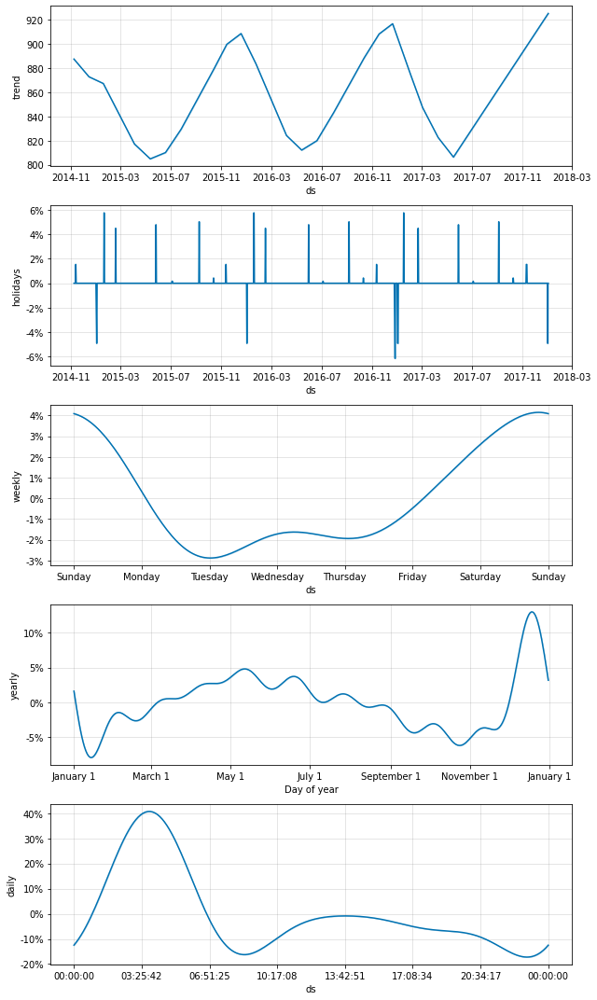

In [60]:
fig1 = model.plot_components(forecast)


1. Based on Daily plot, I have observed that sales is peak between 12PM to 4PM daily

2. From Yearly plot, I can see there is increase in trend during December & January due to christmas holiday & Thanks giving day

3. From Weekly plot, I can see there is increase sales from Thrusday to sunday due weekends.

4. From Trend plot , I have observed that there is seasonality & increase in trend based on Holiday plot.

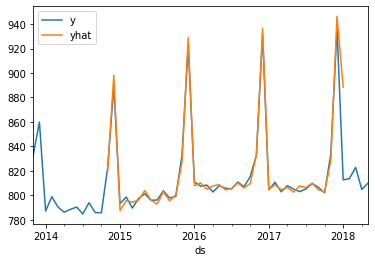

In [61]:
sale_df1['2013':'2018'].resample('M').mean().plot()

From the above trend, it clearly shows that trained model can able to capture all seasonality and trends.

In [62]:
# To find Hourly sales of store
future1 = model.make_future_dataframe(periods=52, freq='60 min')


In [63]:
forecast_H= model.predict(future1)
forecast_H[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)


,ds,yhat,yhat_lower,yhat_upper
47562,2018-01-01 16:15:00,834.388179,668.802917,1010.793710
47563,2018-01-01 17:15:00,816.164858,635.194632,987.374098
47564,2018-01-01 18:15:00,803.826459,623.034579,985.688023
47565,2018-01-01 19:15:00,797.085527,618.423196,968.954908
47566,2018-01-01 20:15:00,783.531828,606.856317,956.199003
47567,2018-01-01 21:15:00,751.760249,565.850724,945.587002
47568,2018-01-01 22:15:00,712.372143,535.119111,880.794735
47569,2018-01-01 23:15:00,703.566175,531.641520,881.013659
47570,2018-01-02 00:15:00,812.957486,630.071733,999.189464
47571,2018-01-02 01:15:00,957.275444,775.709975,1121.678309


from 

In [64]:
sale_df2 = pd.concat([sale_df.set_index('ds')['y'], forecast_H.set_index('ds')['yhat']],axis=1)

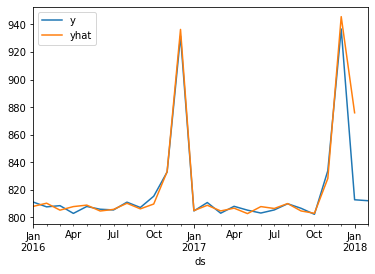

In [65]:
sale_df2['2016-01-01': '2018-02-12'].resample('M').mean().plot()

## Validation

Here I will do cross-validation to assess prediction performance on a horizon of 180 days, starting with 730 days of training data in the first cutoff and then making predictions every 90 days. This corresponds to 4 total forecasts.

In [66]:
from fbprophet.diagnostics import  cross_validation
cv_results = cross_validation(model= model ,initial='730 days', period='180 days', horizon = '365 days')

INFO:fbprophet:Making 1 forecasts with cutoffs between 2016-12-30 21:15:00 and 2016-12-30 21:15:00


In [67]:
cv_results.head()


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2016-12-31 10:00:00,885.627763,713.965305,1055.611161,716,2016-12-30 21:15:00
1,2016-12-31 10:15:00,899.298357,732.927296,1069.755108,638,2016-12-30 21:15:00
2,2016-12-31 10:30:00,912.859609,744.636478,1078.591463,707,2016-12-30 21:15:00
3,2016-12-31 10:45:00,925.861628,750.108616,1099.119926,721,2016-12-30 21:15:00
4,2016-12-31 11:00:00,937.956092,765.141833,1117.148035,845,2016-12-30 21:15:00


In [68]:
from fbprophet.diagnostics import performance_metrics
df_p = performance_metrics(cv_results)
df_p

INFO:fbprophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,coverage
0,36 days 14:00:00,15726.458661,125.405178,101.420258,0.112186,0.836315
1,36 days 14:15:00,15754.673008,125.517620,101.484861,0.112186,0.835653
2,36 days 14:30:00,15713.491082,125.353465,101.363600,0.112177,0.836315
3,36 days 14:45:00,15706.185671,125.324322,101.344522,0.112177,0.836315
4,36 days 15:00:00,15682.555963,125.230012,101.261408,0.112128,0.836978
...,...,...,...,...,...,...
13583,364 days 22:45:00,357234.046341,597.690594,580.838288,0.673430,1.000000
13584,364 days 23:00:00,357278.421236,597.727715,580.872819,0.673430,1.000000
13585,364 days 23:15:00,357373.714211,597.807422,580.945168,0.673430,1.000000
13586,364 days 23:30:00,357410.164489,597.837908,580.974661,0.673430,1.000000



Our baseline Prophet model used default parameters and I got RMSE of 125 to 597 for the period of 365 days. Let's improve the model by tuning parameters

#Hypertuning Prophet model
There are a lot of parameters available in the Prophet model. One of the most important ones is 'holidays'. This lets us pass holidays explicitly while training the model. We'll create a new 'holidays' data frame by taking observations when there was National holiday.

I'll also use three more parameters viz.

interval_width: It defines the uncertainty level to make the prediction. The default value is 0.8 but we'll take 0.95 because we want to be certain in our predictions.

Daily_seasonality: I'll explicitly pass it as 'True' because we know that there is a yearly, Daily seasonality (discussed above) present in our data.

In [96]:
# Define Prophet Model
model1 = Prophet(interval_width=0.95, seasonality_mode='multiplicative', yearly_seasonality=True,daily_seasonality=True, holidays=holidays_df)
model1.fit(train)

In [97]:
future1 = model1.make_future_dataframe(periods=4000, freq='60 min')

future1.shape

(51520, 1)

In [99]:
forecast1= model.predict(future1)
forecast1[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2014-11-07 09:15:00,725.495570,545.876132,888.135465
1,2014-11-07 10:00:00,759.007602,593.150755,938.271834
2,2014-11-07 10:15:00,771.776759,590.730296,946.720412
3,2014-11-07 10:30:00,784.376863,595.755442,969.544756
4,2014-11-07 10:45:00,796.369815,622.447153,985.434196


In [100]:
sale_df3 = pd.concat([sale_df.set_index('ds')['y'], forecast1.set_index('ds')['yhat']],axis=1)

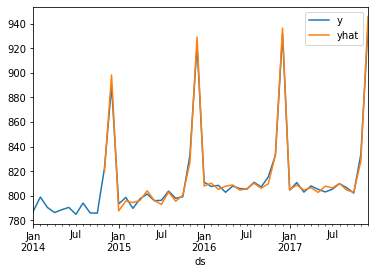

In [105]:
sale_df3['2014':'2017'].resample('M').mean().plot()

In [108]:
# Validation
from fbprophet.diagnostics import  cross_validation
cv_results1 = cross_validation(model= model1,initial='730 days', period='180 days', horizon = '300 days')

INFO:fbprophet:Making 1 forecasts with cutoffs between 2017-03-05 21:15:00 and 2017-03-05 21:15:00


In [111]:
from fbprophet.diagnostics import performance_metrics
df_p1 = performance_metrics(cv_results1)
df_p1

INFO:fbprophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,coverage
0,30 days 18:15:00,4570.109731,67.602587,51.184521,0.051104,0.979871
1,30 days 18:30:00,4575.141958,67.639796,51.211972,0.051104,0.979871
2,30 days 18:45:00,4587.789184,67.733221,51.303434,0.051314,0.979871
3,30 days 19:00:00,4586.307578,67.722283,51.289398,0.051314,0.979871
4,30 days 19:30:00,4582.106600,67.691259,51.237527,0.051104,0.979871
...,...,...,...,...,...,...
11180,299 days 22:45:00,26123.481598,161.627602,128.388963,0.125691,0.811594
11181,299 days 23:00:00,26124.352498,161.630296,128.392822,0.125691,0.811594
11182,299 days 23:15:00,26144.326315,161.692073,128.488187,0.125824,0.811594
11183,299 days 23:30:00,26147.571540,161.702107,128.507595,0.125824,0.811594


#Final Prophet model: 

My baseline Prophet model used default parameters and we got RMSE of 125.14 to 597 and after hyper tuning, I got RMSE of 67 to 161.6
